In [25]:
import yfinance as yf
from copula_trigger_function import CopulaTrigger
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', None)


In [26]:
#pair = ["SNPE","SPY"]
#pair = ["XLK","FDIS"]
#pair = ["FDIS","XLK"]
#pair = ["BBIN","EFA"]
#pair = ["EWG","PIZ"]
#pair = ["EWN","IEUS"]
#pair = ["VWO","SCHE"]
#pair = ["SCHE","VWO"]
#pair = ["VOO","IVV"]
#pair = ["VDE","FENY"]
#pair = ["FENY","VDE"]
pair = ["KO","PEP"]
#pair = ["PEP","KO"]
#pair = ["NIO","XPEV"]
#pair = ["SPYG","VOOG"]
#pair = ["VOOG","SPYG"]

types = ["single_period","cumulative1","cumulative2"]
trade_type = types[1]
historical = yf.download(pair,start="2018-01-01", end="2019-12-31")
historical = historical["Close"]
present = yf.download(pair,start="2020-01-01", end="2020-12-31")
present = present["Close"]

if historical.columns[0] != pair[0]:

    swap_list = [pair[0],pair[1]]
    historical = historical.reindex(columns=swap_list)
    present = present.reindex(columns=swap_list)


[*********************100%***********************]  2 of 2 completed
[*********************100%***********************]  2 of 2 completed


In [27]:
import statsmodels.api as sm
import statsmodels.tsa.stattools as ts


def cointegration_factor(Y,X):
    return sm.OLS(Y, X).fit().params[0]

beta = cointegration_factor(historical[pair[1]],historical[pair[0]])

In [28]:
beta

2.4813375240214346

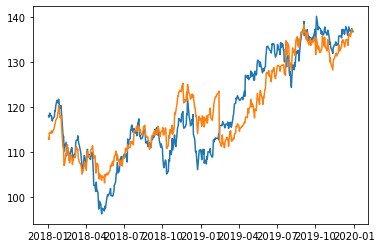

In [29]:
from matplotlib import pyplot as plt
plt.plot(historical[pair[1]])
plt.plot(historical[pair[0]]*beta)

In [30]:
def signal_series(x,y,historical,threshold,plot_figure=False,precision_vector=[10000000,10000000],copula="clayton"):
    # print("before")
    _, result_pkg = CopulaTrigger(copula,[0.02,0.02],historical,threshold,plot_figure=True,recalc=True,result_package=[])
    # print("after")

    log_ret_x = np.log(x.pct_change()+1)
    log_ret_y = np.log(y.pct_change()+1)

    num_units = pd.Series(data=0, index=y.index, name='numUnits')

    for i in range(1,len(y)):
        signal_text, _ = CopulaTrigger(copula, [log_ret_x[i],log_ret_y[i]],historical,threshold,recalc=False,result_package=result_pkg,spread_threshold=0.0)

        if signal_text == "ShortYLongX": num_units[i] = -1
        elif signal_text == "ShortXLongY": num_units[i] = 1
        elif signal_text == "Hold": num_units[i] = 0
        else: num_units[i] = np.nan

        # print("in loop")
    return num_units,result_pkg

def calculate_return(y,x,beta,signals,trade_type):
    """
    Y: price of ETF Y
    X: price of ETF X
    beta: cointegration ratio Y = beta * X
    positions: array indicating position to enter in next day
    """
    
    trade_ins = pd.Series(data=0, index=y.index, name='trade instruction')
    if trade_type == "single_period":
        trade_ins = signals.diff()
        trade_ins[0:1] = 0
        # trade_ins = signals
        # trade_ins[-1] = -signals[-1]
        # trade_ins[-1] = -np.sum(trade_ins)    
    elif trade_type == "cumulative1":
        trade_ins = signals.copy()
        trade_ins[-1] = 0
        trade_ins[-1] = -1 * np.sum(trade_ins)

    elif trade_type == "cumulative2":
        # will force to clear position when encounter different sign
        trade_ins = signals.copy()
        cum_count = 0

        trade_ins[0] = signals[0]
        cum_count = signals[0]
        for i in range(1, len(trade_ins)-1):
            # case: different sign -> force clear
            if cum_count * signals[i] < 0:
                trade_ins[i] = -cum_count
                cum_count = 0
            else:
                trade_ins[i] = signals[i]
                cum_count = cum_count + signals[i]
        trade_ins[-1] = -cum_count


    """
    combined_signals is the final trading instruction
    +ve = long y, short x
    0 = hold
    -ve = short y, long x
    """

    portfolio_daily = -(y*trade_ins - beta*x*trade_ins)
    portfolio_daily.name = "portfolio_daily"
    portfolio_accum = portfolio_daily.cumsum()
    portfolio_accum.name = "portfolio_accum"

    df = pd.concat([signals, trade_ins, x, y,portfolio_daily, portfolio_accum], axis=1)

    return df


frank is optimal for KO and PEP


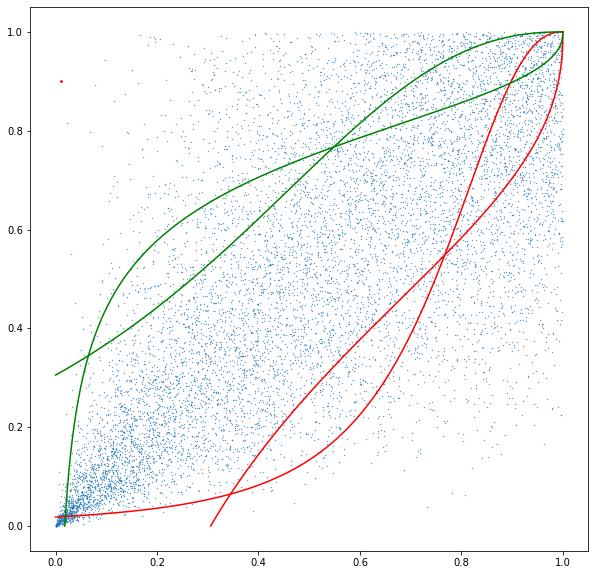

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

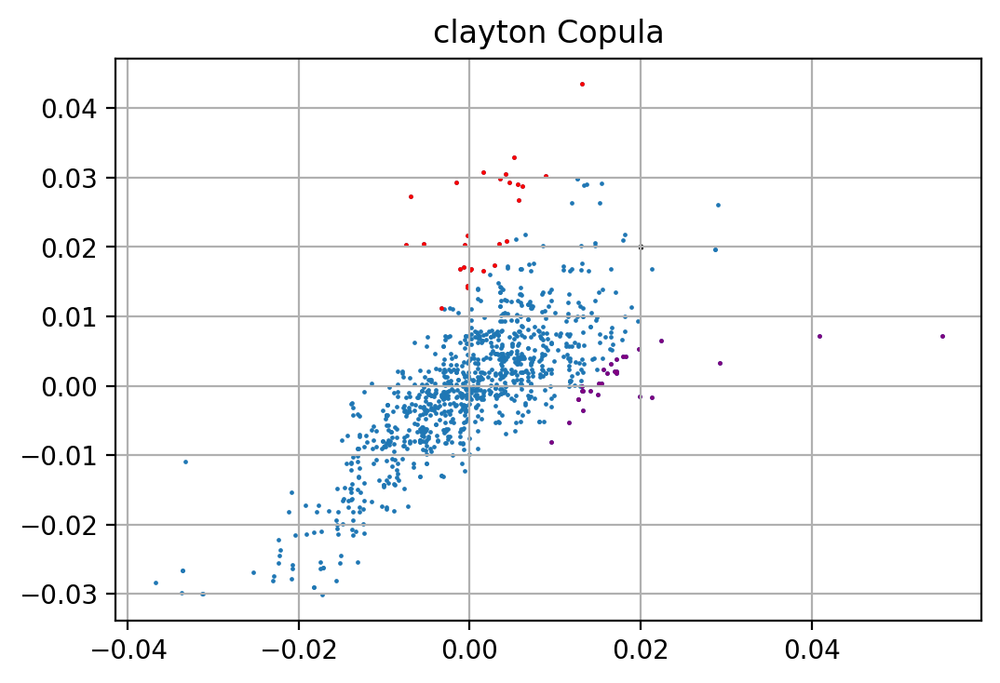

                   KO         PEP  ColOneReturn  ColTwoReturn
Date                                                         
2018-01-03  45.439999  117.750000     -0.002198     -0.002629
2018-01-04  46.080002  118.330002      0.013986      0.004914
2018-01-05  46.070000  118.669998     -0.000217      0.002869
2018-01-08  46.000000  117.989998     -0.001521     -0.005747
2018-01-09  46.230000  118.080002      0.004988      0.000763
2018-01-10  46.070000  117.480003     -0.003467     -0.005094
2018-01-11  46.040001  116.879997     -0.000651     -0.005120
2018-01-12  46.150002  117.379997      0.002386      0.004269
2018-01-16  46.529999  117.860001      0.008200      0.004081
2018-01-17  46.820000  119.180000      0.006213      0.011137
2018-01-18  46.880001  119.050003      0.001281     -0.001091
2018-01-19  47.160000  120.169998      0.005955      0.009364
2018-01-22  47.380001  121.510002      0.004654      0.011089
2018-01-23  47.450001  121.300003      0.001476     -0.001730
2018-01-

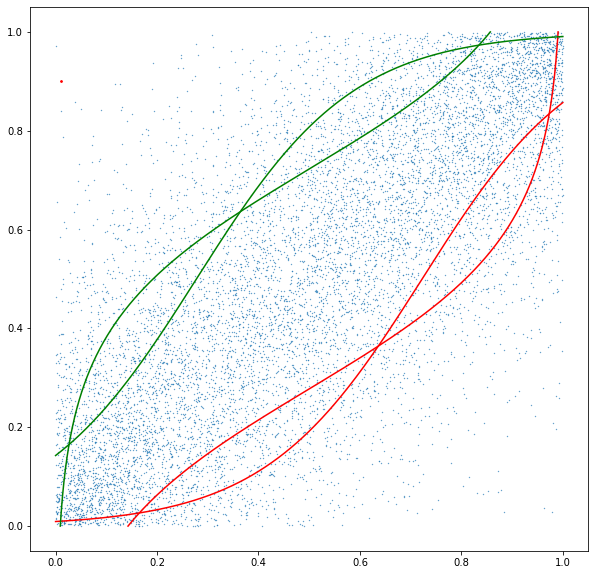

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

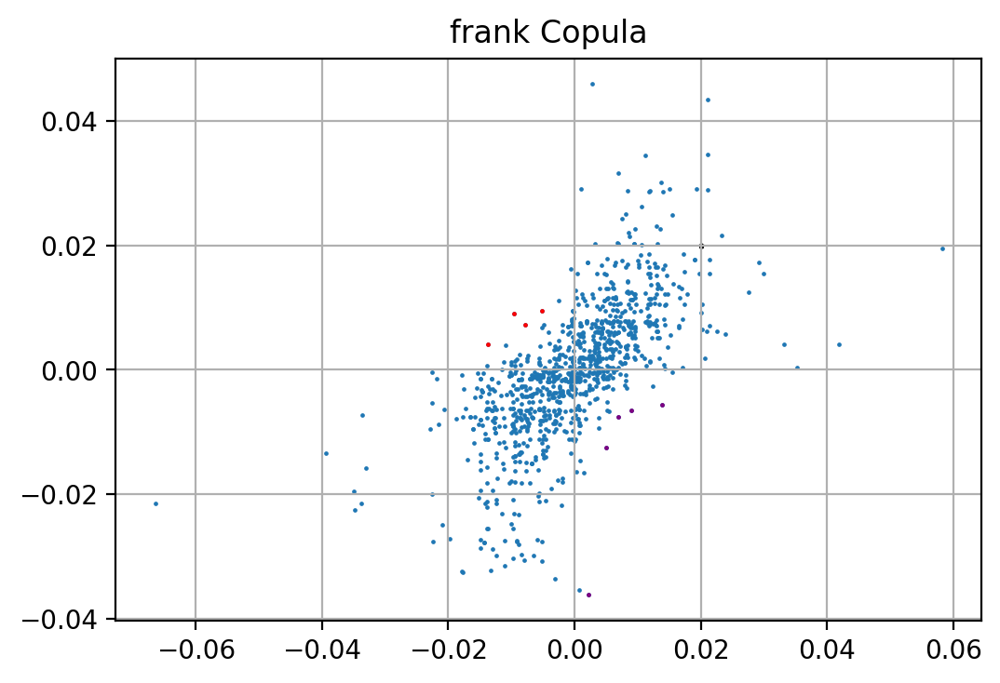

                   KO         PEP  ColOneReturn  ColTwoReturn
Date                                                         
2018-01-04  46.080002  118.330002      0.013986      0.004914
2018-01-05  46.070000  118.669998     -0.000217      0.002869
2018-01-08  46.000000  117.989998     -0.001521     -0.005747
2018-01-09  46.230000  118.080002      0.004988      0.000763
2018-01-10  46.070000  117.480003     -0.003467     -0.005094
2018-01-11  46.040001  116.879997     -0.000651     -0.005120
2018-01-12  46.150002  117.379997      0.002386      0.004269
2018-01-16  46.529999  117.860001      0.008200      0.004081
2018-01-17  46.820000  119.180000      0.006213      0.011137
2018-01-18  46.880001  119.050003      0.001281     -0.001091
2018-01-19  47.160000  120.169998      0.005955      0.009364
2018-01-22  47.380001  121.510002      0.004654      0.011089
2018-01-23  47.450001  121.300003      0.001476     -0.001730
2018-01-24  47.830002  121.139999      0.007977     -0.001320
2018-01-

In [31]:
_,result_pkg = signal_series(present[pair[0]], present[pair[1]],historical,0.1)
copula = result_pkg[13]
print(copula)
signals,_ = signal_series(present[pair[0]], present[pair[1]],historical,0.1,copula=copula)
print(signals)

In [32]:
#signals.to_excel("pepko.xlsx")


            numUnits  numUnits         KO         PEP  portfolio_daily  \
Date                                                                     
2020-01-02         0         0  54.990002  135.820007        -0.000000   
2020-01-03         0         0  54.689999  135.630005        -0.000000   
2020-01-06         0         0  54.669998  136.149994        -0.000000   
2020-01-07         0         0  54.250000  134.009995        -0.000000   
2020-01-08         0         0  54.349998  134.699997        -0.000000   
2020-01-09         0         0  55.340000  134.789993        -0.000000   
2020-01-10         0         0  55.529999  134.529999        -0.000000   
2020-01-13         0         0  56.130001  136.529999        -0.000000   
2020-01-14         0         0  56.000000  136.850006        -0.000000   
2020-01-15         0         0  56.700001  139.199997        -0.000000   
2020-01-16         0         0  56.820000  139.610001        -0.000000   
2020-01-17         0         0  56.939

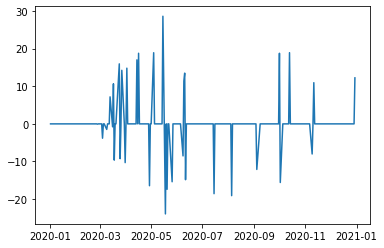

In [33]:
from matplotlib import pyplot as plt


return_df = calculate_return(present[pair[1]], present[pair[0]],beta,signals,trade_type)
print(return_df)
plt.figure()
plt.plot(return_df["portfolio_daily"])

In [34]:
return_df.columns = ['numUnits', 'cumnumUnits', 'FDIS', 'XLK', 'portfolio_daily',\
       'portfolio_accum']

In [35]:
print(max(return_df["cumnumUnits"]),min(return_df["cumnumUnits"]))

1 -1


In [36]:
return_df["Yposition"] = return_df["cumnumUnits"].cumsum()
return_df["PortfolioValueAddCash"] = return_df["portfolio_accum"]  - return_df["Yposition"]*return_df.iloc[:,2]*beta+return_df["Yposition"]*return_df.iloc[:,3]

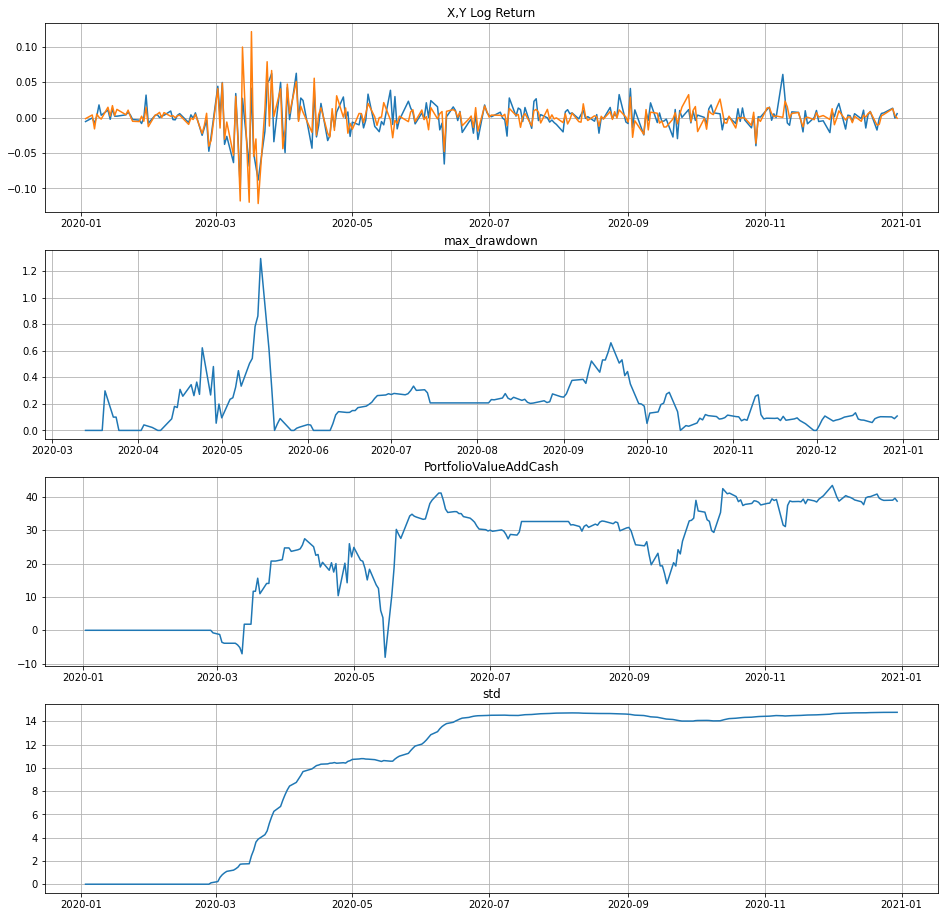

In [37]:
return_df["X_log_return"] = np.log(return_df["FDIS"]/return_df["FDIS"].shift())
return_df["Y_log_return"] = np.log(return_df["XLK"]/return_df["XLK"].shift())
return_df["log_spread"] = return_df["X_log_return"] - return_df["Y_log_return"]
return_df["max_drawdown"] = (return_df["PortfolioValueAddCash"].cummax() - return_df["PortfolioValueAddCash"])/return_df["PortfolioValueAddCash"].cummax()
return_df["std"] = return_df['PortfolioValueAddCash'].expanding().std()
fig, axs = plt.subplots(4,figsize=(16, 16))

for i in range(4):
    axs[i].grid()
axs[0].set_title("X,Y Log Return")
axs[1].set_title("max_drawdown")
axs[2].set_title("PortfolioValueAddCash")
axs[3].set_title("std")
axs[0].plot(return_df.loc[:,:][["X_log_return",	"Y_log_return"]])
axs[1].plot(return_df.loc[:,:][["max_drawdown"]])
axs[2].plot(return_df.loc[:,:][["PortfolioValueAddCash"]])
axs[3].plot(return_df.loc[:,:][["std"]])

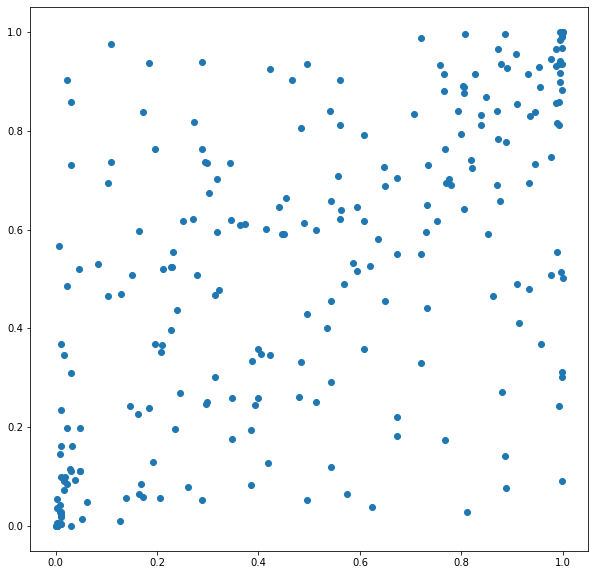

In [38]:
df = pd.DataFrame(result_pkg[-1])
plt.figure(figsize=(10,10))
plt.scatter(df.iloc[:,0],df.iloc[:,1])

In [50]:
result_pkg[-1][54]

[0.0, 0.0]

In [40]:
return_df.replace([np.inf, -np.inf], np.nan, inplace=True)
maxdrawdown = max(return_df["max_drawdown"].dropna())
lastpnl = return_df["PortfolioValueAddCash"][-1]
std = return_df.iloc[-1,:].loc["std"]
print(f"The maxdrawdown is {maxdrawdown*100:.2f}%, the end of term profit is {lastpnl:.2f}, the std is {std}")

The maxdrawdown is 129.50%, the end of term profit is 38.68, the std is 14.767017545645889


In [41]:
return_df[return_df["numUnits"]==1]

,numUnits,cumnumUnits,FDIS,XLK,portfolio_daily,portfolio_accum,Yposition,PortfolioValueAddCash,X_log_return,Y_log_return,log_spread,max_drawdown,std
Date,,,,,,,,,,,,,
2020-02-27,1,1,54.930000,136.369995,-0.070124,-0.070124,1,0.000000,-0.047463,-0.040314,-0.007148,NaN,0.000000
2020-03-09,1,1,51.860001,130.160004,-1.477838,-5.358365,1,-3.880527,-0.063501,-0.053112,-0.010389,NaN,1.207261
2020-03-16,1,1,45.259998,113.089996,-0.784664,1.036535,1,1.821199,-0.068521,-0.119540,0.051019,0.000000,1.757344
2020-03-18,1,1,44.849998,120.919998,-9.632014,2.055017,1,11.687031,-0.050647,-0.054711,0.004065,0.000000,2.935755
2020-03-25,1,1,41.610001,112.500000,-9.251544,20.735661,0,20.735661,0.053306,-0.011841,0.065147,0.000000,5.240619
2020-03-31,1,1,44.250000,120.099998,-10.300813,24.668784,0,24.668784,-0.016807,-0.043822,0.027015,0.000000,7.221189
2020-04-29,1,1,47.119999,133.360001,-16.439379,58.816592,-2,25.937834,0.008097,-0.021953,0.030050,0.054383,10.552565
2020-05-18,1,1,44.970001,135.520004,-23.934253,82.402103,-3,10.599345,0.038767,-0.003168,0.041935,0.613579,10.569132
2020-05-20,1,1,45.889999,131.259995,-17.391417,65.010686,-2,30.227852,0.029860,-0.003574,0.033434,0.000000,10.752229


In [42]:
(return_df["X_log_return"]-return_df["Y_log_return"]).loc[return_df[return_df["numUnits"]==1].index]

Date
2020-02-27   -0.007148
2020-03-09   -0.010389
2020-03-16    0.051019
2020-03-18    0.004065
2020-03-25    0.065147
2020-03-31    0.027015
2020-04-29    0.030050
2020-05-18    0.041935
2020-05-20    0.033434
2020-05-26    0.028878
2020-06-08    0.017101
2020-06-11   -0.017414
2020-07-15    0.025084
2020-08-05    0.020202
2020-09-04    0.015419
2020-10-02    0.023305
2020-11-09    0.060678
dtype: float64

In [43]:
return_df

,numUnits,cumnumUnits,FDIS,XLK,portfolio_daily,portfolio_accum,Yposition,PortfolioValueAddCash,X_log_return,Y_log_return,log_spread,max_drawdown,std
Date,,,,,,,,,,,,,
2020-01-02,0,0,54.990002,135.820007,-0.000000,-0.000000,0,0.000000,NaN,NaN,NaN,NaN,NaN
2020-01-03,0,0,54.689999,135.630005,-0.000000,-0.000000,0,0.000000,-0.005471,-0.001400,-0.004071,NaN,0.000000
2020-01-06,0,0,54.669998,136.149994,-0.000000,-0.000000,0,0.000000,-0.000366,0.003827,-0.004192,NaN,0.000000
2020-01-07,0,0,54.250000,134.009995,-0.000000,-0.000000,0,0.000000,-0.007712,-0.015843,0.008131,NaN,0.000000
2020-01-08,0,0,54.349998,134.699997,-0.000000,-0.000000,0,0.000000,0.001842,0.005136,-0.003294,NaN,0.000000
2020-01-09,0,0,55.340000,134.789993,-0.000000,-0.000000,0,0.000000,0.018051,0.000668,0.017383,NaN,0.000000
2020-01-10,0,0,55.529999,134.529999,-0.000000,-0.000000,0,0.000000,0.003427,-0.001931,0.005358,NaN,0.000000
2020-01-13,0,0,56.130001,136.529999,-0.000000,-0.000000,0,0.000000,0.010747,0.014757,-0.004010,NaN,0.000000
2020-01-14,0,0,56.000000,136.850006,-0.000000,-0.000000,0,0.000000,-0.002319,0.002341,-0.004660,NaN,0.000000


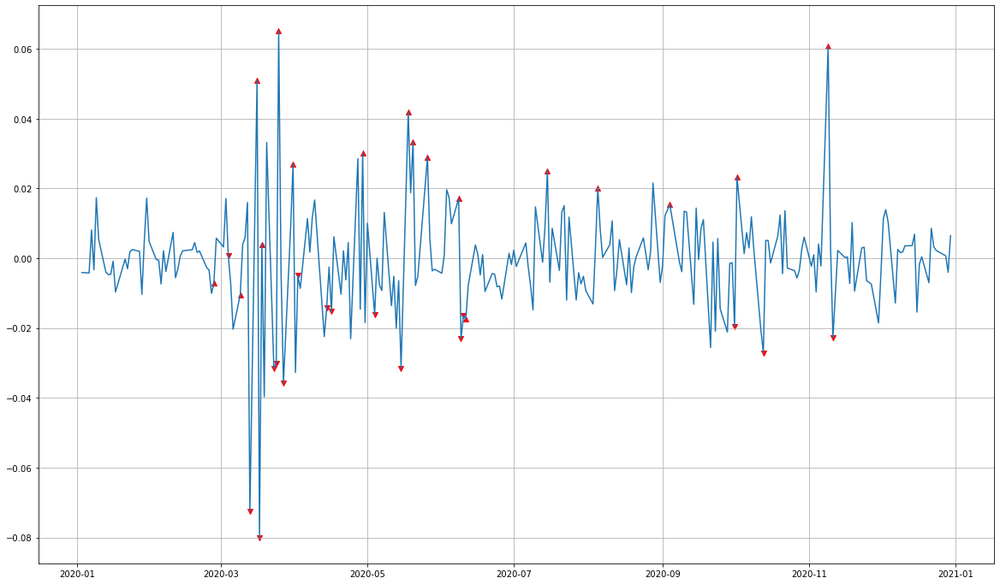

In [44]:
plt.figure(figsize=(20,12))
plt.grid()
plt.plot(return_df["X_log_return"]-return_df["Y_log_return"])
plt.scatter(return_df[return_df["numUnits"]==1].index,(return_df["X_log_return"]-return_df["Y_log_return"]).loc[return_df[return_df["numUnits"]==1].index],c="r",marker="^")
plt.scatter(return_df[return_df["numUnits"]==-1].index,(return_df["X_log_return"]-return_df["Y_log_return"]).loc[return_df[return_df["numUnits"]==-1].index],c="r",marker="v")

In [45]:
spread = return_df["X_log_return"]-return_df["Y_log_return"]
spread.loc["2017-06-01":"2017-07-01"]

Series([], dtype: float64)

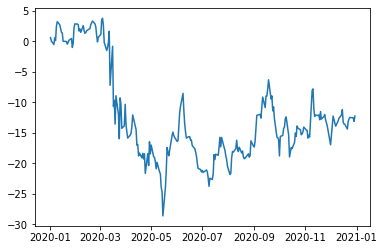

In [46]:
plt.plot((return_df["FDIS"]*beta-return_df["XLK"]))

In [47]:
diff = return_df["FDIS"]-return_df["XLK"]
diff.loc["2017-06-01":"2017-07-01"]

Series([], dtype: float64)

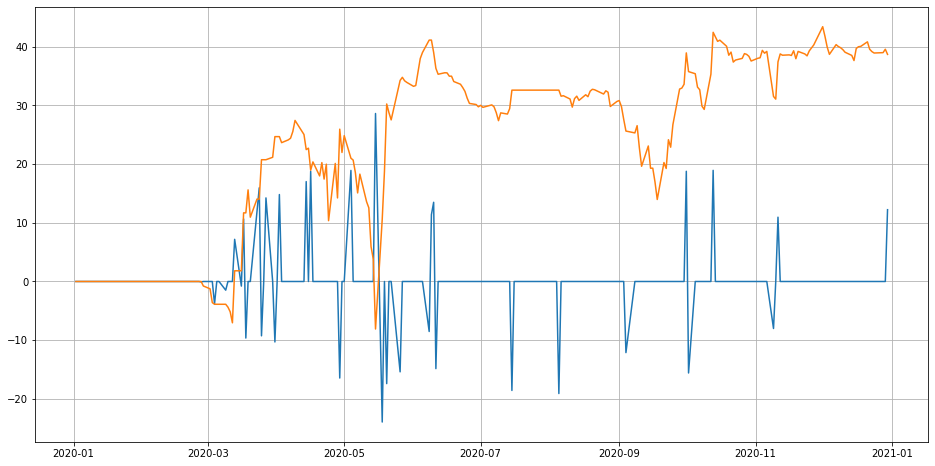

In [48]:
plt.figure(figsize=(16,8))
plt.plot(return_df["portfolio_daily"])
plt.plot(return_df["PortfolioValueAddCash"])
plt.grid()